In [2]:
%load_ext autoreload
%autoreload 2

import matplotlib

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from visualise_results.utils import *
import numpy as np
from typing import *
import glob

import sys, os, shutil

ROOT_PROJECT =  os.path.join(os.path.normpath(os.path.join(os.getcwd()))) 
sys.path[0] = ROOT_PROJECT

In [4]:
from bo.custom_init import InitialBODataset, get_initial_dataset_path
from bo.utils import save_w_pickle
from tqdm import tqdm

/home/tianyu/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
result_by_method = []

for meth_file in glob.glob("./results_data/*_optim_res.csv"):
    result_by_method.append(pd.read_csv(meth_file, index_col=0))
results = pd.concat(result_by_method)
results = results.loc[np.sort(results.index.values)]

In [6]:
with open("./dataloader/core_antigens.txt") as f:
    core_antigens = list(map(lambda antigen: antigen.rstrip(), f.readlines()))


with open('./utils_data/all_antigens.txt') as file:
    antigens = file.readlines()
    all_antigens = [antigen.rstrip() for antigen in antigens]

remaining_antigens = list(set(all_antigens)-set(core_antigens))

In [7]:
thresholdPd = pd.read_csv("./utils_data/ListThresholds.txt", sep=" ")
# Mascotte and above 1% 

In [8]:
# For each of the 12 core_antigens
# 
# 1 inital dataset Loosers (20)  # samples to get to Mascotte,Heroes,SuperHeroes
# 1 inital dataset Loosers+Mascotte (20) # samples to get to Heroes,SuperHeroes
# 1 inital dataset Loosers+Mascotte+Heroes (20) # samples to get to SuperHeroes

AA = 'ACDEFGHIKLMNPQRSTVWY'
AA_to_idx = {aa: i for i, aa in enumerate(AA)}

categories = ['NonBinders', 'Loosers', 'Mascotte', 'Heroes', 'SuperHeroes']

def get_energy_interval(antigen, category):
    if category not in categories:
        raise(ValueError(category))
    ind = categories.index(category)
    upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
    if ind == (len(categories) - 1):
        lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[ind]]['minEnergy'].values[0]
    else:
        lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
    return lower_bound, upper_bound

In [9]:
antigen_name_ = "2DD8_S"
get_energy_interval(antigen=antigen_name_, category='SuperHeroes')

/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[ind]]['minEnergy'].values[0]


(-125.07, -119.16)

In [10]:
def get_proteins_by_category(antigen, category, top_cut_ratio=0):
    """
    antigen: the name of the antigen
    category: the name of the category (Loosers,...)
    top_cut_ratio: remove the top `top_cut_ratio` * 100 % of the protein in terms of binding energy (the lower the better)
    """
    aux_results = results[results.Antigen == antigen]
    lower_energy, upper_energy = get_energy_interval(antigen=antigen, category=category)
    aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
    aux_results = aux_results[['Last Protein', 'Last Binding Energy']].drop_duplicates(subset=['Last Protein']).values
    
    # Keep the highest energies
    keeps = np.ceil(top_cut_ratio * len(aux_results)).astype(int)
    inds = aux_results[:, 1].argsort()[keeps:]
    return aux_results[inds]

In [11]:
proteins_scores_ = get_proteins_by_category('2DD8_S', 'SuperHeroes', 0)
proteins_scores_.shape

/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[ind]]['minEnergy'].values[0]
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


(1734, 2)

In [12]:
def getInitUpToCat(antigen: str, top_category: str, n: int, top_cat_top_cut_ratio: float=0, seed: int = 0):
    if top_category not in categories:
        raise(ValueError(top_category))
    np.random.seed(seed)
    ind = categories.index(top_category)
    n_per_cats = [n // ind for _ in range(ind)]
    n_per_cats[-1] = n - sum(n_per_cats[:-1])
    top_cut_ratios = [0 for _ in range(ind)]
    top_cut_ratios[-1] = top_cat_top_cut_ratio
    assert sum(n_per_cats) == n
    samples = []
    for i in range(ind):
        n_sample = n_per_cats[i]
        top_cut_ratio = top_cut_ratios[i]
        category = categories[i + 1]
        proteins_scores = get_proteins_by_category(antigen, category=category, top_cut_ratio=top_cut_ratio)
        sampled_inds = np.random.choice(np.arange(len(proteins_scores)), size=n_sample)
        samples.extend([[category, np.array([AA_to_idx[el] for el in  proteins_scores[sample_ind][0]]), proteins_scores[sample_ind][0], proteins_scores[sample_ind][1]] for sample_ind in sampled_inds])
    return pd.DataFrame(samples, columns=['type', 'AA to ind', 'Protein', 'Binding Energy'])

In [13]:
def getInitDataset(antigen: str, n_per_cat: Dict[str, int], top_cut_ratio_per_cat: Dict[str, float], seed: int):
    np.random.seed(seed)
    samples = []
    for category, n_sample in n_per_cat.items():
        top_cut_ratio = top_cut_ratio_per_cat.get(category, 0)
        proteins_scores = get_proteins_by_category(antigen, category=category, top_cut_ratio=top_cut_ratio)
        sampled_inds = np.random.choice(np.arange(len(proteins_scores)), size=n_sample)
        samples.extend([[category, np.array([AA_to_idx[el] for el in  proteins_scores[sample_ind][0]]), proteins_scores[sample_ind][0], proteins_scores[sample_ind][1]] for sample_ind in sampled_inds])
    return pd.DataFrame(samples, columns=['type', 'AA to ind', 'Protein', 'Binding Energy'])

In [14]:
def get_n_per_cat(n_loosers: int, n_mascottes: int, n_heroes):
    return dict(Loosers=n_loosers, Mascotte=n_mascottes, Heroes=n_heroes)

def get_top_cut_ratio_per_cat(top_cut_ratio_loosers: int, top_cut_ratio_mascottes: int, top_cut_ratio_heroes):
    return dict(Loosers=top_cut_ratio_loosers, Mascotte=top_cut_ratio_mascottes, Heroes=top_cut_ratio_heroes)


In [15]:
n_per_cat_s = [get_n_per_cat(20, 0, 0), get_n_per_cat(10, 10, 0), get_n_per_cat(6, 6, 8)] 
top_cut_ratio_per_cat_s = [get_top_cut_ratio_per_cat(0.5, 0, 0), get_top_cut_ratio_per_cat(0, 0.5, 0), get_top_cut_ratio_per_cat(0, 0, 0.5)]

selected_antigens = all_antigens

invalid_antigens_ = []
for antigen_name_ in tqdm(selected_antigens):
    for top_cut_ratio_per_cat_, n_per_cat_ in zip(top_cut_ratio_per_cat_s, n_per_cat_s):
        if len(results[results.Antigen == antigen_name_]) == 0:
            invalid_antigens_.append(antigen_name_)
            continue
        try:
            for seed_ in range(10):
                res = getInitDataset(antigen=antigen_name_, n_per_cat=n_per_cat_, top_cut_ratio_per_cat=top_cut_ratio_per_cat_, seed=seed_)        
                data = InitialBODataset(res)
                save_path = get_initial_dataset_path(
                    antigen_name=antigen_name_, n_per_cat=n_per_cat_, top_cut_ratio_per_cat=top_cut_ratio_per_cat_, seed=seed_
                )
                assert data.get_index_encoded_x().shape == (sum(n_per_cat_.values()), 11)
                save_w_pickle(data, save_path)
                print(save_path)
        except IndexError as e:
            invalid_antigens_.append(antigen_name_)
            print(antigen_name_)

  0%|          | 0/191 [00:00<?, ?it/s]/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]


/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ADQ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FBI_X/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1H0D_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NSN_S/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OB1_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1WEJ_F/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YPV_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RAJ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VRL_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2DD8_S/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1S78_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2JEL_P/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
S3A3_A


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
  7%|▋         | 13/191 [00:47<08:13,  2.77s/it]

S3A3_A
S3A3_A
S3B3_A
S3B3_A


  7%|▋         | 14/191 [00:47<05:54,  2.00s/it]

S3B3_A
S3C3_A
S3C3_A


  8%|▊         | 15/191 [00:47<04:17,  1.46s/it]

S3C3_A
S3D3_A


  8%|▊         | 16/191 [00:48<03:15,  1.12s/it]

S3D3_A
S3D3_A
S3E3_A
S3E3_A


  9%|▉         | 17/191 [00:48<02:28,  1.17it/s]

S3E3_A
S3F3_A
S3F3_A


  9%|▉         | 18/191 [00:48<01:53,  1.52it/s]

S3F3_A
S3G3_A
S3G3_A


 10%|▉         | 19/191 [00:48<01:29,  1.91it/s]

S3G3_A
S3H3_A
S3H3_A


 10%|█         | 20/191 [00:48<01:13,  2.34it/s]

S3H3_A
S2A2_A
S2A2_A


 11%|█         | 21/191 [00:49<01:01,  2.76it/s]

S2A2_A
S2B2_A
S2B2_A


 12%|█▏        | 22/191 [00:49<00:53,  3.17it/s]

S2B2_A
S2C2_A
S2C2_A


 12%|█▏        | 23/191 [00:49<00:47,  3.53it/s]

S2C2_A
S2D2_A
S2D2_A


 13%|█▎        | 24/191 [00:49<00:43,  3.84it/s]

S2D2_A
S2E2_A
S2E2_A


 13%|█▎        | 25/191 [00:49<00:40,  4.08it/s]

S2E2_A
S2F2_A
S2F2_A


 14%|█▎        | 26/191 [00:50<00:38,  4.27it/s]

S2F2_A
S2G2_A
S2G2_A


 14%|█▍        | 27/191 [00:50<00:36,  4.43it/s]

S2G2_A
S2H2_A
S2H2_A


 15%|█▍        | 28/191 [00:50<00:37,  4.32it/s]

S2H2_A
S4A4_A
S4A4_A


 15%|█▌        | 29/191 [00:50<00:36,  4.46it/s]

S4A4_A
S4B4_A
S4B4_A


 16%|█▌        | 30/191 [00:51<00:35,  4.52it/s]

S4B4_A
S4C4_A
S4C4_A


 16%|█▌        | 31/191 [00:51<00:34,  4.61it/s]

S4C4_A
S4D4_A
S4D4_A


 17%|█▋        | 32/191 [00:51<00:33,  4.68it/s]

S4D4_A
S4E4_A
S4E4_A


 17%|█▋        | 33/191 [00:51<00:33,  4.73it/s]

S4E4_A
S4F4_A
S4F4_A


 18%|█▊        | 34/191 [00:51<00:33,  4.75it/s]

S4F4_A
S4G4_A
S4G4_A


 18%|█▊        | 35/191 [00:52<00:32,  4.78it/s]

S4G4_A
S4H4_A
S4H4_A


 19%|█▉        | 36/191 [00:52<00:32,  4.79it/s]

S4H4_A
S5A5_A
S5A5_A


 19%|█▉        | 37/191 [00:52<00:32,  4.78it/s]

S5A5_A
S5B5_A
S5B5_A


 20%|█▉        | 38/191 [00:52<00:31,  4.79it/s]

S5B5_A
S5C5_A
S5C5_A


 20%|██        | 39/191 [00:52<00:31,  4.80it/s]

S5C5_A
S5D5_A
S5D5_A


 21%|██        | 40/191 [00:53<00:31,  4.81it/s]

S5D5_A
S5E5_A
S5E5_A


 21%|██▏       | 41/191 [00:53<00:31,  4.82it/s]

S5E5_A
S5F5_A
S5F5_A


 22%|██▏       | 42/191 [00:53<00:30,  4.83it/s]

S5F5_A
S5G5_A
S5G5_A


 23%|██▎       | 43/191 [00:53<00:30,  4.85it/s]

S5G5_A
S5H5_A
S5H5_A


 23%|██▎       | 44/191 [00:53<00:30,  4.86it/s]

S5H5_A
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FNS_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1FSK_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OSP_O/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1PKQ_J/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1TQB_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1YJD_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1ZTX_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1RJL_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2B2X_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2IH3_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R29_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R56_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2UZI_R/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXQ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2VXT_I/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2W9E_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XWT_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2YC1_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DO2_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 34%|███▍      | 65/191 [02:04<05:36,  2.67s/it]

3B9K_A
3B9K_A
3B9K_A


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BGF_S/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 36%|███▌      | 68/191 [02:08<03:09,  1.54s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


3G04_C
3G04_C
3G04_C


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3GI9_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3HI6_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3JBQ_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KJ4_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KR3_D/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3KS0_J/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
3L5W_I


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 39%|███▉      | 75/191 [02:30<04:46,  2.47s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


3L5W_I
3L5W_I


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3MJ9_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NH7_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3Q3G_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R08_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RKD_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3RVV_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SKJ_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3WD5_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4AEI_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4H88_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
4Hj0_A


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 45%|████▌     | 86/191 [03:07<04:32,  2.59s/it]

4Hj0_A
4Hj0_A


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HJ0_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
4IJ3_A
4IJ3_A


 46%|████▌     | 88/191 [03:11<03:38,  2.12s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


4IJ3_A
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K24_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K3J_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KI5_M/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4KXZ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
4KXZ_B


 49%|████▊     | 93/191 [03:26<03:53,  2.39s/it]

4KXZ_B
4KXZ_B
4KXZ_E
4KXZ_E


 49%|████▉     | 94/191 [03:26<02:48,  1.73s/it]

4KXZ_E
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4N9G_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4NP4_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OKV_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4PP1_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QCI_D/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QNP_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4R9Y_D/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4WV1_F/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YPG_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFG_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZFO_F/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5B8C_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C0N_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5C7X_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5CZV_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5D93_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DHV_M/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DMI_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8D_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E8E_LH/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EPM_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5H35_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5IKC_M/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JW4_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5JZ7_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
5JZ7_B
5JZ7_B


 63%|██████▎   | 120/191 [04:58<03:05,  2.61s/it]

5JZ7_B
5JZ7_E
5JZ7_E


 64%|██████▍   | 122/191 [04:58<01:33,  1.35s/it]

5JZ7_E


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5L0Q_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5LQB_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5MES_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5T5F_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TZ2_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1JPS_T/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1KB5_AB/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
1MHP_A
1MHP_A


 68%|██████▊   | 130/191 [05:24<02:30,  2.47s/it]

1MHP_A
1NCA_N
1NCA_N


 69%|██████▊   | 131/191 [05:25<01:47,  1.79s/it]

1NCA_N
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1OAZ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1QFW_AB/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/1NCB_N/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ARJ_RQ/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2FD6_AU/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2Q8A_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
2R0K_A


 72%|███████▏  | 138/191 [05:46<02:08,  2.43s/it]

2R0K_A
2R0K_A
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2R4R_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2WUC_I/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2XQB_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/2ZCH_P/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3BN9_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3CVH_ABC/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3DVG_XY/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L5X_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3L95_X/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NCY_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3NFP_I/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
3NPS_A


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 79%|███████▊  | 150/191 [06:26<01:44,  2.56s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


3NPS_A
3NPS_A
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3R1G_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 80%|███████▉  | 152/191 [06:30<01:21,  2.10s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


3SO3_A
3SO3_A
3SO3_A


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3SQO_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3TT1_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3U9P_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3UBX_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3V6O_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/3VG9_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4CAD_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4DKE_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4HC1_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I18_R/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4I77_Z/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4K9E_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
 86%|████████▋ | 165/191 [07:15<01:08,  2.64s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


4LQF_A
4LQF_A
4LQF_A


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4LU5_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
4M7L_T
4M7L_T


 87%|████████▋ | 167/191 [07:19<00:51,  2.14s/it]/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


4M7L_T
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4MXV_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4OII_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QEX_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4QWW_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4RGM_S/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U1G_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4U6V_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4Y5V_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4YUE_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/4ZSO_E/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5BVP_I/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5DFV_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5E94_G/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EII_G/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EU7_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5EZO_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5F3B_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5FB8_C/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HDQ_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/1/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/6/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5HI4_B/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/4/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/5/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5J13_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5KTE_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/0/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/2/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/3/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/7/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/8/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/9/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TH9_A/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/0/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/1/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/2/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/3/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/4/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/5/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/6/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/7/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/8/Loosers-20_Loosers-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/9/Loosers-20_Loosers-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/0/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/1/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/2/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/3/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/4/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/5/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/6/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/7/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/8/Loosers-10_Mascotte-10_Mascotte-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/9/Loosers-10_Mascotte-10_Mascotte-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/0/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/1/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/2/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/3/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/4/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/5/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/6/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/7/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data
/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/8/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]
/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20:

/home/tianyu/code/biodrug/HEBO/AntBO/bo/init_dataset/5TLJ_X/9/Loosers-6_Mascotte-6_Heroes-8_Heroes-0.5/init_data


In [16]:
with open('./dataloader/valid_antigens_init_data.txt', 'w') as f:
    f.writelines(map(lambda a: a + '\n', list(set(all_antigens).difference(invalid_antigens_))))

In [17]:
len(set(all_antigens).difference(invalid_antigens_))

140

In [33]:
proteins_scores_ = get_proteins_by_category(antigen_name_, category='Loosers', top_cut_ratio=.5)

/tmp/ipykernel_463258/3744245844.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upper_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==category]['maxEnergy'].values[0]
/tmp/ipykernel_463258/3744245844.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lower_bound = thresholdPd[thresholdPd.AGname==antigen][thresholdPd.type==categories[min(len(categories) - 1, ind + 1)]]['maxEnergy'].values[0] + 0.01
/tmp/ipykernel_463258/1088760158.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aux_results = aux_results[aux_results['Last Binding Energy'] < upper_energy][aux_results['Last Binding Energy'] > lower_energy]


In [37]:
proteins_scores_.shape

(764, 2)

In [41]:
scors=[]
for i in range(len(proteins_scores_)):
    scors.append(proteins_scores_[i][1])

(array([67., 79., 61., 79., 83., 74., 74., 69., 90., 88.]),
 array([-92.09999847, -91.89399863, -91.68799878, -91.48199893,
        -91.27599908, -91.06999924, -90.86399939, -90.65799954,
        -90.45199969, -90.24599985, -90.04      ]),
 <BarContainer object of 10 artists>)

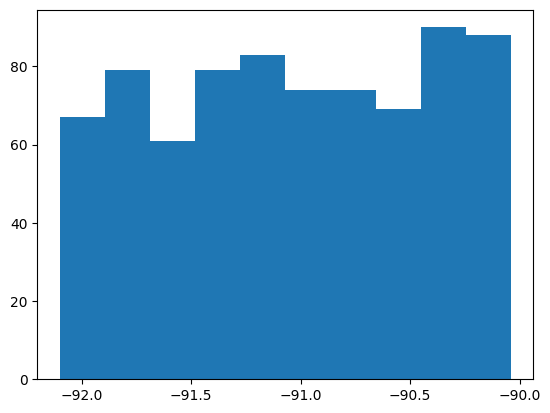

In [43]:
import matplotlib.pyplot as plt
plt.hist(scors)

In [46]:
max(scors)

-90.04

In [47]:
min(scors)

-92.0999984741211